In [ ]:
import numpy as np
import pandas as pd
import scipy.io
import matplotlib.pyplot as plt
import os
import math
from tqdm import tqdm
import itertools
from copy import deepcopy
import time
from collections import Counter
import cv2
from scipy.spatial.distance import cdist

#Downloading and extracting the Dataset

In [ ]:
if 'BSR_bsds500.tgz' not in os.listdir():
  !wget http://www.eecs.berkeley.edu/Research/Projects/CS/vision/grouping/BSR/BSR_bsds500.tgz

--2021-05-21 21:33:28--  http://www.eecs.berkeley.edu/Research/Projects/CS/vision/grouping/BSR/BSR_bsds500.tgz
Resolving www.eecs.berkeley.edu (www.eecs.berkeley.edu)... 23.185.0.1, 2620:12a:8000::1, 2620:12a:8001::1
Connecting to www.eecs.berkeley.edu (www.eecs.berkeley.edu)|23.185.0.1|:80... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: https://www.eecs.berkeley.edu/Research/Projects/CS/vision/grouping/BSR/BSR_bsds500.tgz [following]
--2021-05-21 21:33:28--  https://www.eecs.berkeley.edu/Research/Projects/CS/vision/grouping/BSR/BSR_bsds500.tgz
Connecting to www.eecs.berkeley.edu (www.eecs.berkeley.edu)|23.185.0.1|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: https://www2.eecs.berkeley.edu/Research/Projects/CS/vision/grouping/BSR/BSR_bsds500.tgz [following]
--2021-05-21 21:33:28--  https://www2.eecs.berkeley.edu/Research/Projects/CS/vision/grouping/BSR/BSR_bsds500.tgz
Resolving www2.eecs.berkeley.edu (ww

In [ ]:
if 'BSR' not in os.listdir():
  !gunzip -c BSR_bsds500.tgz| tar xvf -

BSR/
BSR/documentation/
BSR/documentation/Arbelaez_Maire_Fowlkes_Malik_TPAMI2010.pdf
BSR/bench/
BSR/bench/source/
BSR/bench/source/match.hh
BSR/bench/source/Matrix.cc
BSR/bench/source/Timer.cc
BSR/bench/source/csa_types.h
BSR/bench/source/csa.cc
BSR/bench/source/correspondPixels.cc
BSR/bench/source/build.sh
BSR/bench/source/match.cc
BSR/bench/source/Sort.hh
BSR/bench/source/csa_defs.h
BSR/bench/source/Timer.hh
BSR/bench/source/Exception.cc
BSR/bench/source/String.cc
BSR/bench/source/Array.hh
BSR/bench/source/kofn.hh
BSR/bench/source/Random.hh
BSR/bench/source/Exception.hh
BSR/bench/source/.gitignore
BSR/bench/source/kofn.cc
BSR/bench/source/build.m
BSR/bench/source/Random.cc
BSR/bench/source/Point.hh
BSR/bench/source/README
BSR/bench/source/Matrix.hh
BSR/bench/source/csa.hh
BSR/bench/source/String.hh
BSR/bench/bench_bsds500.m
BSR/bench/data/
BSR/bench/data/groundTruth/
BSR/bench/data/groundTruth/6046.mat
BSR/bench/data/groundTruth/2018.mat
BSR/bench/data/groundTruth/8068.mat
BSR/bench/

## Helper functions to get the images and their ground truths from the Dataset

In [ ]:
def is_valid_index_param(possible_index: str, length_of_list: int) -> bool:
  '''
  Checks if the given index is possible for slicing the list
  inputs:
    possible_index: a string that should represent the index needed for slicing
    length_of_list: the length of the list that the index will slice
  returns:
    True: if the string has a numeric value and this numeric value is less than the length of the list
    False: Otherwise
  '''
  if possible_index.isnumeric():
    if int(possible_index) < length_of_list:
      return True
  return False
 
def check_correct_path(path: str):
  '''
  Checks if the path name is correct and has the needed folders for further processing
  Raises an Exception if the path is not found within the current directory
  Raises a Exception if the path is found within the current directory but the folder doesn't have 2 folders [images, groundTruth]
  '''
  try:
    if 'images' in os.listdir(path):
      if 'groundTruth' in os.listdir(path):
        return
    raise Exception("Directory doesn't have expected folder names [images, groundTruth]") 
  except FileNotFoundError:
    raise FileNotFoundError("Folder not found from current directory")
 
def check_for_invalid_batch_name(batch: str):
  '''
  Checks if the batch name is correct ['test', 'train', 'val']
  Raises an Exception otherwise
  '''
  if batch.lower() == 'test':
    return 
  if batch.lower() == 'train':
    return 
  if batch.lower() == 'val':
    return 
  raise Exception("name of batch can ONLY be one of the following ['test', 'train', 'val']")
 
def needed_image_names_and_GT_names(images_names: list, groundTruths_names: list, number_of_imgs: str) -> (list, list):
  '''
  Gets a list of file names of images and a list of groundTruths
  and returns the needed number of images and groundTruths
  input:
    images_names: a List of images file names (.jpg)
    groundTruths_names: a List of groundTruths_names (.mat)
    number_of_imgs: a string that represents whether we need a specific number from the input lists or all the lists in that case write 'all'
  returns:
    images_names: New list of file names (.jpg)
    groundTruths_names: New list of file names (.mat)
  '''
  if is_valid_index_param(number_of_imgs, len(images_names)):
    images_names = images_names[: int(number_of_imgs)]
    groundTruths_names = groundTruths_names[: int(number_of_imgs)]
  elif number_of_imgs == 'all':
    # the full list of images_names has the last element to be (Thumbs.db) getting rid of that
    images_names = images_names[:-1]
  else:
    raise Exception("number_of_imgs has invalid values, please check possible argument values from get_batch_of_images_with_groundtruth() function comments")
  return images_names, groundTruths_names

In [ ]:
def get_batch_of_images_with_groundtruth(path: str = 'BSR/BSDS500/data', batch: str = 'train', number_of_imgs: str = 'all') -> (list, list, list):
  '''
  The function goes to the path of the dataset and gets a number of images based on the input arguments
  inputs:
    path: the path of the dataset (where the train, test, validation images are)  
    batch: specifies whether the user wants to get images from the train, test or val. Default 'train'
    number_of_imgs: number of images in string form to be taken from specified folder should be between (0 -> number of img files in folder)
                    or 'all' which gets all files in the folder. Default 'all'
  returns:
    images: a list of original images each image is a nd-array
    groundTruths_seg: a list of length equals to the length of images list, but each element is a list of all groundTruths segmentations of that image element
                  Example --> the groundTruths_seg of images[0] are groundTruths_seg[0][i] for i = 0 -> len(groundTruths_seg[0])
    groundTruths_bound: a list of length equals to the length of images list, but each element is a list of all groundTruths boundaries of that image element
                  Example --> the groundTruths_bound of images[0] are groundTruths_bound[0][i] for i = 0 -> len(groundTruths_bound[0])
  '''  
  check_correct_path(path)
  check_for_invalid_batch_name(batch)
  images_path = path + '/images/' + batch.lower()
  groundtruth_path = path + '/groundTruth/' + batch.lower()

  images_names = os.listdir(images_path)
  groundTruths_names = os.listdir(groundtruth_path)
  images_names.sort()
  groundTruths_names.sort()

  images_names, groundTruths_names = needed_image_names_and_GT_names(images_names = images_names,
                                                                     groundTruths_names = groundTruths_names,
                                                                     number_of_imgs = number_of_imgs)
  
  images = []
  groundTruths_seg = []
  groundTruths_bound = []

  for image_name, groundTruth_name in zip(images_names, groundTruths_names):
    image_full_path = images_path + '/' + image_name
    groundTruth_full_path = groundtruth_path + '/' + groundTruth_name
    images.append(plt.imread(image_full_path))
    mat = scipy.io.loadmat(groundTruth_full_path)
    seg_images = []
    boundaries_images = []
    for i in range(mat['groundTruth'].shape[1]):
      seg_images.append(mat['groundTruth'][0][i][0][0][0])
      boundaries_images.append(mat['groundTruth'][0][i][0][0][1])

    groundTruths_seg.append(seg_images)
    groundTruths_bound.append(boundaries_images)

  return images, groundTruths_seg, groundTruths_bound  

## A function that draws an image with its corresponding ground truths

In [ ]:
def draw_image_and_segmentations(image: np.array, first_seg_group: list, second_seg_group: list = [], draw_image = True):
  '''
  Draws the image first and then all the segmentations that came from it (ground truths or our segmentations)
  inputs: 
    image: the image to be drawn
    first_seg_group: a list of segmentations (ground truth or our segmentations) for image, MUST make sure that they correspond to (image)
    second_seg_group: a list of segmentations (ground truth or our segmentations) or boundaries (2nd point in assignment) for image, MUST make sure that they correspond to the (image)
                      Default: an empty list, if we want to only draw image with just 1 group of segmentations
  '''
  if draw_image:
    plt.imshow(image)
    plt.show()
  num_imgs = len(first_seg_group)
  num_groups = 2

  draw_second_group = True

  if len(second_seg_group) == 0:
    num_groups = 1
    second_seg_group = np.zeros((num_imgs, num_groups))
    draw_second_group = False

  i = 1
  for first_group_img, second_group_img in zip(first_seg_group, second_seg_group):
    fig = plt.figure(figsize = (10, 15))
    plt.subplot(num_imgs, num_groups, i)
    plt.imshow(first_group_img)
    if draw_second_group:
      plt.subplot(num_imgs, num_groups, i+1)
      plt.imshow(second_group_img)
    plt.show()
    i += num_groups


In [ ]:
images, groundTruths_seg, groundTruths_bound = get_batch_of_images_with_groundtruth(batch = 'test', number_of_imgs = '50')

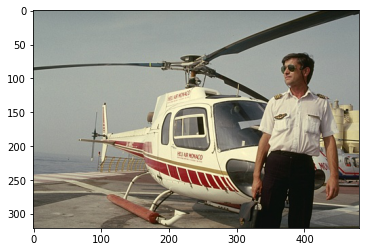

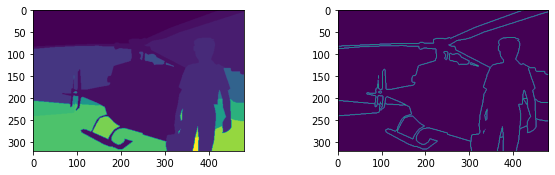

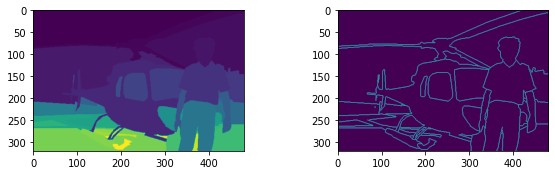

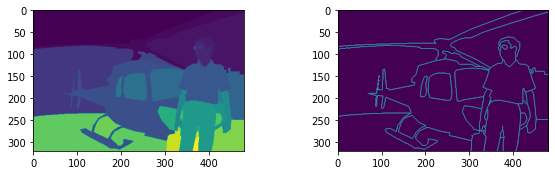

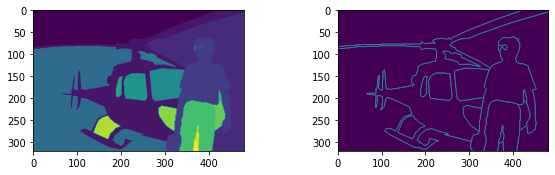

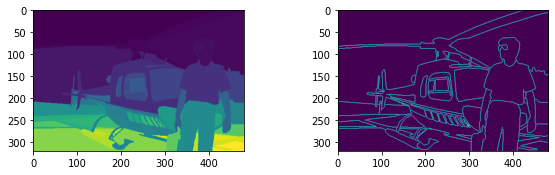

In [ ]:
draw_image_and_segmentations(image = images[44],
                            first_seg_group = groundTruths_seg[44],
                            second_seg_group = groundTruths_bound[44])

# Produce Vectorized images

In [ ]:
def images_to_np_array(images):
  '''
    a simple utility method just transofrms the images to a numpy array of 
    mattrices so we can continue processing without issues
  '''
  m = images[0].shape[0]
  n = images[0].shape[1]
  z = len(images)
  vectorized_images = np.zeros((z, m*n, 3))
  for i, img in enumerate(images):
    vec_img = img.reshape(-1,3)
    vectorized_images[i] = vec_img
  return vectorized_images
  
numpy_images=images_to_np_array(images)


# Produce Vectorized images for spatial encoded pixels

In [ ]:
def images_to_np_extra(images):

  xlen=len(images[0][0])
  x_range=list(range(xlen))
  y_range=len(images[0])
  x_cors=x_range*y_range
  y_cors=list(itertools.chain.from_iterable(itertools.repeat(x, xlen) for x in range(y_range)))
  imgs=images_to_np_array(images)
  dim_array=np.array([x_cors,y_cors],dtype='float').T
  ret_array=np.array([np.append(i, dim_array,axis=1) for i in imgs])
  return ret_array
images_np_extra=images_to_np_extra(images)

#Kmeans function and mapping the resulted clusters to colors

In [ ]:
def Kmeans(vectorized_img: np.array, k: int, tol: float, max_iter:int = 300) -> (np.array, np.array):
  '''
  The studied clustering algorithm
  inputs: 
    vectorized_img: nd-array where every row represents a pixel of the image and each row has the channels of the img
    k: the number of clusters
    tol: the tolerance that checks if the centroids stop changing places
    max_iter: the max number of iterations to be done if the algorithm did not converge
  returns:
    curr_centroids: the final centroids that resulted from the algorithm
    clusters: the final assignment of pixels to each cluster
  '''
  t = 0
  centroids_idx = np.random.choice(vectorized_img.shape[0], k, replace=False)
  
  if vectorized_img.shape[1] == 5:
    normalized_vectorized_img = np.zeros(vectorized_img.shape)
    normalized_vectorized_img[:, :3] = vectorized_img[:, :3] / 255.0
    normalized_vectorized_img[:, 3:] = (vectorized_img[:, 3:] - np.min(vectorized_img[:, 3:])) / np.max(vectorized_img[:, 3:])
  else:
    normalized_vectorized_img = vectorized_img / 255.0  
  # nd-array for the centroids for each cluster
  centroids = np.zeros((k, normalized_vectorized_img.shape[1]))
  # getting the centroids from the image pixels
  for i, idx in enumerate(centroids_idx):
    centroids[i] = normalized_vectorized_img[idx]
  curr_centeroids = deepcopy(centroids)
  prev_centeroids = np.zeros(curr_centeroids.shape)
  clusters = np.zeros(normalized_vectorized_img.shape[0])
  # each row will contain the distance between every pixel and a all centroids
  distance_matrix = np.zeros((normalized_vectorized_img.shape[0], k))
  err = np.abs(np.linalg.norm(curr_centeroids - prev_centeroids))
  while t < max_iter and err > tol:
    t += 1
    for i in range(k): # making distance matrix
       distance_matrix[:, i] = np.linalg.norm(normalized_vectorized_img - curr_centeroids[i], axis = 1)
    clusters = np.argmin(distance_matrix, axis = 1)
    
    prev_centeroids = deepcopy(curr_centeroids)

    for i in range(k): # assigning new centroids
      if len(normalized_vectorized_img[clusters == i]) == 0:
        continue
      curr_centeroids[i] = np.mean(normalized_vectorized_img[clusters == i], axis = 0)
    err = np.abs(np.linalg.norm(curr_centeroids - prev_centeroids))

  return curr_centeroids, clusters

In [ ]:
def map_clusters_to_colors(original_image: np.array, vectorized_image: np.array, clusters: np.array, num_clusters: int) -> list:
  '''
  Proposing a way to map colors to clusters depending on the number of clusters
  Should work on any number of clusters
  inputs:
    original_image: an (m, n, 3) nd-array, which is the original image without clustering, we need it just for its shape[0], and shape[1]
    vectorized_image: an (m*n, c) nd-array, which is the original image after being flattened from 3D nd-array into 2D where the rows are all the pixels and the columns
                      are the channels can be 3 if we are just clustring on (R, G, B) or 5 if we are doing Spatial Clustring (R, G, B, x, y)
    clusters: an (m*n, ) nd-array, which is the output of the Kmeans function
    num_clusters: which is k
  returns:
    colored_clustered_img: the image after color assignment to each cluster 
  '''
  m, n, _ = original_image.shape
  colors = []
  np.random.seed(100)
  for i in range(num_clusters):
    random_RGB = np.array([np.random.choice(range(256), size=3)])
    colors.append(random_RGB)

  colored_clustered_img = []
  for i in range(vectorized_image.shape[0]):
    colored_clustered_img.append(colors[clusters[i]])
  
  colored_clustered_img = np.asarray(colored_clustered_img).reshape(m, n, 3)

  return colored_clustered_img

In [ ]:
def get_all_clustered_images(images, vectorized_images, k):
  '''
  runs Kmeans on all the images that we retreived from the dataset and saves the colored clustered images
  inputs:
    images: (m, n, 3) original images
    vectoirzed_images: (m*n, c) c depending on the number of channels (3 or 5)
    k: number of clusters that we will run kmeans on
  outputs:
    all_segmented_images: a list of all images after clustering ready to be drawn
  '''
  all_segmented_images = []
  all_clusters = []
  for original_img, vectorized_img in zip(images, vectorized_images):
    
    centroids, clusters = Kmeans(vectorized_img, k = k, tol = 0.000001)
    all_clusters.append(clusters)
    clustered_image = map_clusters_to_colors(original_image = original_img,
                                             vectorized_image = vectorized_img,
                                             clusters = clusters,
                                             num_clusters = k)
    
    all_segmented_images.append(clustered_image)
    
  return all_segmented_images, all_clusters

# Clustering evaluation

In [ ]:
def compute_contingency_mat(clusters, ground_truth):
  k = np.max(clusters) + 1
  num_classes = np.max(ground_truth)        
  n = len(clusters)                         # Total number of pixels
  counts = Counter(clusters)                # number of pixels in each cluster

  contingency_mat = np.zeros(shape=(k, num_classes))

  for i in range(k):
    class_counts_in_cluster = Counter(ground_truth[clusters == i])       # number of pixels of each class in this particular cluster
    for j in class_counts_in_cluster.keys():
      contingency_mat[i][j-1] = class_counts_in_cluster[j]

  return contingency_mat

1. Conditional entropy

In [ ]:
def compute_conditional_entropy(contingency_mat):
  clusters_counts = np.sum(contingency_mat, axis=1)           # number of pixels in each cluster
  n = np.sum(clusters_counts)                                 # Total number of pixels
  
  contingency_mat = contingency_mat / clusters_counts[:,None]                       # dividing each row of contingency_mat with its corresponding clusters_counts element
  after_log = np.log2(contingency_mat, out=np.zeros_like(contingency_mat), where=(contingency_mat!=0))    # taking log of all elements in contingency_mat
  contingency_mat = -1 * contingency_mat * after_log

  total_conditional_entropy = np.sum((clusters_counts / n) * np.sum(contingency_mat, axis=1))
  
  return total_conditional_entropy

2. F-*measure*

In [ ]:
def compute_F_measure(contingency_mat):
  k = contingency_mat.shape[0]
  clusters_counts = np.sum(contingency_mat, axis=1)           # number of pixels in each cluster
  classes_counts = np.sum(contingency_mat, axis=0)            # number of pixels in each class
  
  dominant_classes_idx = np.argmax(contingency_mat, axis=1)
  dominant_classes_counts = np.zeros(k)
  for i in range(k):
    dominant_classes_counts[i] = contingency_mat[i, dominant_classes_idx[i]]

  # precisions = dominant_classes_counts / clusters_counts
  # I used the divide function from numpy to avoid dividing by 0
  precisions = np.divide(dominant_classes_counts, clusters_counts, out=np.ones(k), where=clusters_counts!=0)
  
  # recalls = dominant_classes_counts / reduced_classes_counts
  reduced_classes_counts = classes_counts[dominant_classes_idx]
  recalls = np.divide(dominant_classes_counts, reduced_classes_counts, out=np.ones(k), where=reduced_classes_counts!=0)

  f_measure_per_cluster = (2 * precisions * recalls) / (precisions + recalls)
  total_f_measure = np.mean(f_measure_per_cluster)
  
  return total_f_measure

# Run Kmeans on the 50 images

In [ ]:
def get_entropy_and_fmeasure(clusters, ground_truth):
  contingency_mat = compute_contingency_mat(clusters, ground_truth)
  H_TC = compute_conditional_entropy(contingency_mat)
  F_measure = compute_F_measure(contingency_mat)
  return H_TC, F_measure

In [ ]:
def get_full_entropy_and_fmeasure_dict(all_clusters, groundTruths_seg):  
  full_entropy_dict = {}
  full_fmeasure_dict = {}


  for i, cluster in enumerate(all_clusters):
    entropy_list = []
    fmeasure_list = []
    for j, ground_truth in enumerate(groundTruths_seg[i]):
      ground_truth = ground_truth.flatten()
      htc, fmeasure = get_entropy_and_fmeasure(cluster, ground_truth)
      entropy_list.append(htc)
      fmeasure_list.append(fmeasure)

    full_entropy_dict[f'image{i}'] = entropy_list
    full_fmeasure_dict[f'image{i}'] = fmeasure_list

  return full_entropy_dict, full_fmeasure_dict

In [ ]:
all_segmented_images_per_k = {}
all_clusters_per_k = {}
entropy_dict_per_k = {}
fmeasure_dict_per_k = {}

## Kmeans at k = 3

In [ ]:
t1 = time.time()

all_segmented_images, all_clusters = get_all_clustered_images(images=images, 
                                                              vectorized_images=numpy_images, 
                                                              k = 3)

full_entropy_dict, full_fmeasure_dict = get_full_entropy_and_fmeasure_dict(all_clusters = all_clusters,
                                                                           groundTruths_seg = groundTruths_seg)
  
all_segmented_images_per_k[3] = all_segmented_images
all_clusters_per_k[3] = all_clusters
entropy_dict_per_k[3] = full_entropy_dict
fmeasure_dict_per_k[3] = full_fmeasure_dict

t2 = time.time()

print(f"time taken to run with all K = 3: {t2 - t1}")

time taken to run with all K = 3: 70.30475163459778


## Kmeans at k = 5

In [ ]:

t1 = time.time()

all_segmented_images, all_clusters = get_all_clustered_images(images=images, 
                                                              vectorized_images=numpy_images, 
                                                              k = 5)

full_entropy_dict, full_fmeasure_dict = get_full_entropy_and_fmeasure_dict(all_clusters = all_clusters,
                                                                           groundTruths_seg = groundTruths_seg)
  
all_segmented_images_per_k[5] = all_segmented_images
all_clusters_per_k[5] = all_clusters
entropy_dict_per_k[5] = full_entropy_dict
fmeasure_dict_per_k[5] = full_fmeasure_dict

t2 = time.time()

print(f"time taken to run with all K = 5: {t2 - t1}")

time taken to run with all K = 5: 152.15534901618958


## Kmeans at k = 7

In [ ]:

t1 = time.time()

all_segmented_images, all_clusters = get_all_clustered_images(images=images, 
                                                              vectorized_images=numpy_images, 
                                                              k = 7)

full_entropy_dict, full_fmeasure_dict = get_full_entropy_and_fmeasure_dict(all_clusters = all_clusters,
                                                                           groundTruths_seg = groundTruths_seg)
  
all_segmented_images_per_k[7] = all_segmented_images
all_clusters_per_k[7] = all_clusters
entropy_dict_per_k[7] = full_entropy_dict
fmeasure_dict_per_k[7] = full_fmeasure_dict

t2 = time.time()

print(f"time taken to run with all K = 7: {t2 - t1}")

time taken to run with all K = 7: 320.898535490036


## Kmeans at k = 9

In [ ]:
t1 = time.time()

all_segmented_images, all_clusters = get_all_clustered_images(images=images, 
                                                              vectorized_images=numpy_images, 
                                                              k = 9)

full_entropy_dict, full_fmeasure_dict = get_full_entropy_and_fmeasure_dict(all_clusters = all_clusters,
                                                                           groundTruths_seg = groundTruths_seg)
  
all_segmented_images_per_k[9] = all_segmented_images
all_clusters_per_k[9] = all_clusters
entropy_dict_per_k[9] = full_entropy_dict
fmeasure_dict_per_k[9] = full_fmeasure_dict

t2 = time.time()

print(f"time taken to run with all K = 9: {t2 - t1}")

time taken to run with all K = 9: 478.81556940078735


## Kmeans at k = 11

In [ ]:
t1 = time.time()

all_segmented_images, all_clusters = get_all_clustered_images(images=images, 
                                                              vectorized_images=numpy_images, 
                                                              k = 11)

full_entropy_dict, full_fmeasure_dict = get_full_entropy_and_fmeasure_dict(all_clusters = all_clusters,
                                                                           groundTruths_seg = groundTruths_seg)
  
all_segmented_images_per_k[11] = all_segmented_images
all_clusters_per_k[11] = all_clusters
entropy_dict_per_k[11] = full_entropy_dict
fmeasure_dict_per_k[11] = full_fmeasure_dict

t2 = time.time()

print(f"time taken to run with all K = 11: {t2 - t1}")

time taken to run with all K = 11: 687.2705488204956


# Visualization

In [ ]:
def get_avg_entire_dataset(entropy, fmeasure):

  entropy = list(entropy.values())
  fmeasure = list(fmeasure.values())
  ent_list = []
  f_list = []
  for i in range(len(entropy)):
    ent_list.append(np.mean(entropy[i]))
    f_list.append(np.mean(fmeasure[i]))
  
  ret_entropy_value = np.mean(ent_list)
  ret_f_value = np.mean(f_list)
  return ret_entropy_value, ret_f_value

In [ ]:
def get_mean_per_image(eval_results):
  ret_list = []
  for i in range(len(eval_results)):
    x = np.mean(eval_results[f'image{i}'])
    ret_list.append(x)
  return ret_list

In [ ]:
img_name_list = [f'image{i}' for i in range(50)]

In [ ]:
k_vals = [3, 5, 7, 9, 11]
for k in k_vals:
  avg_per_image = get_mean_per_image(entropy_dict_per_k[k])
  df_entropy = pd.DataFrame(data = avg_per_image, index = img_name_list)
  ax = df_entropy.plot(kind="bar", legend = False, ylabel = 'Conditional Entropy', title = f'bar plot for average conditional entropy per image for K = {k}', figsize=(20, 8), grid = True)

In [ ]:
k_vals = [3, 5, 7, 9, 11]
for k in k_vals:
  avg_per_image = get_mean_per_image(fmeasure_dict_per_k[k])
  df_fmeasure = pd.DataFrame(data = avg_per_image, index = img_name_list)
  ax = df_fmeasure.plot(kind="bar", legend = False, ylabel = 'Fmeasure', title = f'bar plot for average Fmeasure per image for K = {k}', figsize=(20, 8), grid = True)

In [ ]:
def big_picture_things(image, groundTruths, segmented_image, entropy = [], fmeasure = []):
  fig = plt.figure(figsize=(10, 15))
  plt.subplot(1, 2, 1)
  plt.imshow(image)
  plt.subplot(1, 2, 2)
  plt.imshow(segmented_image)
  plt.show()
  for i, groundTruth in enumerate(groundTruths):
    fig = plt.figure(figsize=(5, 7))
    plt.imshow(groundTruth)
    plt.show()
    if len(entropy) > 0:
      print(f"Conditional Entropy with this Ground Truth = {entropy[i]}")
      print(f"Fmeasure with this Ground Truth = {fmeasure[i]}")

## Display An image I with M ground truth segmentations for K clusters and report the Conditional Entropy and F-measure for each ground truth, the average of the M trials and the average of the entire Dataset

In [ ]:
k_vals = [3, 5, 7, 9, 11]         # K clusters
avg_f_measure_per_k = []
avg_entropy_per_k = []
for k in k_vals:
  avg_entropy, avg_fmeasure = get_avg_entire_dataset(entropy_dict_per_k[k], fmeasure_dict_per_k[k])
  avg_entropy_per_k.append(avg_entropy)
  avg_f_measure_per_k.append(avg_fmeasure)

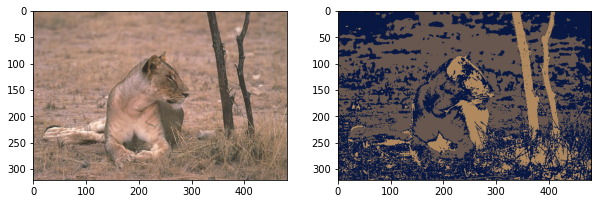

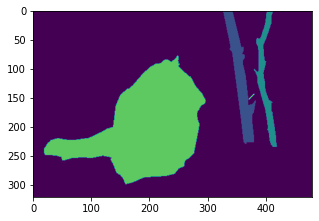

Conditional Entropy with this Ground Truth = 0.8506357507598687
Fmeasure with this Ground Truth = 0.4388592593553258


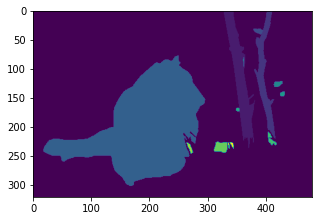

Conditional Entropy with this Ground Truth = 0.9124722580215536
Fmeasure with this Ground Truth = 0.4385606053348607


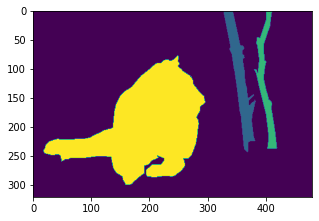

Conditional Entropy with this Ground Truth = 0.84980717561946
Fmeasure with this Ground Truth = 0.43914368650997143


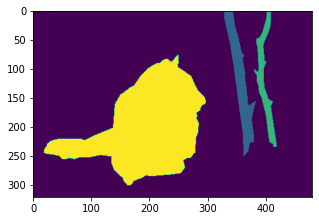

Conditional Entropy with this Ground Truth = 0.8527270426872939
Fmeasure with this Ground Truth = 0.43878938776487453


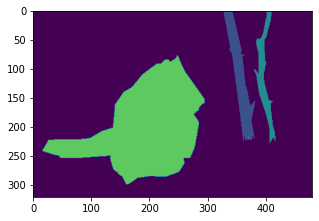

Conditional Entropy with this Ground Truth = 0.8394667197054537
Fmeasure with this Ground Truth = 0.4402370106492424
Average Conditional Entropy of M trials for image12 = 0.861021789358726
Average Fmeasure of M trials for image12 = 0.43911798992285495


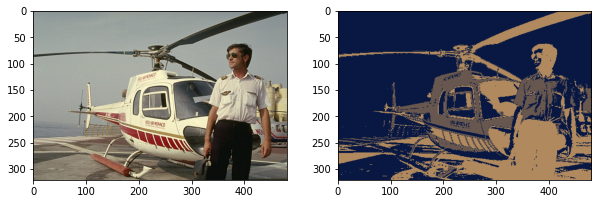

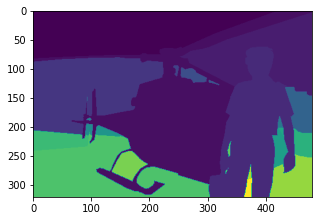

Conditional Entropy with this Ground Truth = 2.585671294784592
Fmeasure with this Ground Truth = 0.4045904863856538


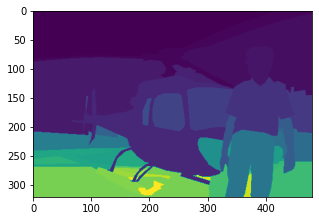

Conditional Entropy with this Ground Truth = 3.4249756820378425
Fmeasure with this Ground Truth = 0.4390331692632163


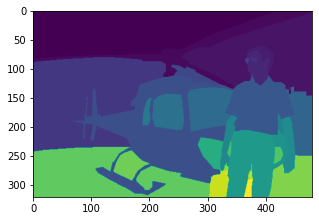

Conditional Entropy with this Ground Truth = 3.056579150460347
Fmeasure with this Ground Truth = 0.4331384702475685


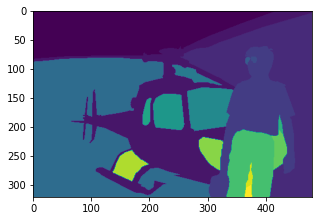

Conditional Entropy with this Ground Truth = 2.4763985818975627
Fmeasure with this Ground Truth = 0.4281754050161701


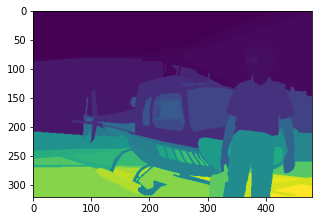

Conditional Entropy with this Ground Truth = 3.676767997658759
Fmeasure with this Ground Truth = 0.453748703256083
Average Conditional Entropy of M trials for image44 = 3.0440785413678206
Average Fmeasure of M trials for image44 = 0.4317372468337384
Average Conditional Entropy of Entire Dataset for (K = 3) = 1.854062136349292
Average Fmeasure of Entire Dataset for (K = 3) = 0.5172948831684431


In [ ]:
I_vals = [12, 44]                 # image numbers from 0 -> 49
for j, k in enumerate([3]):
  for i in I_vals:
    big_picture_things(image = images[i],
                       groundTruths = groundTruths_seg[i],
                       segmented_image = all_segmented_images_per_k[k][i],
                       entropy = entropy_dict_per_k[k][f'image{i}'],
                       fmeasure = fmeasure_dict_per_k[k][f'image{i}'])
    print("======================================================================================================")
    print(f"Average Conditional Entropy of M trials for image{i} = {np.mean(entropy_dict_per_k[k][f'image{i}'])}")
    print(f"Average Fmeasure of M trials for image{i} = {np.mean(fmeasure_dict_per_k[k][f'image{i}'])}")
    print("======================================================================================================")
  avg_entropy, avg_fmeasure = get_avg_entire_dataset(entropy_dict_per_k[k], fmeasure_dict_per_k[k])
  print(f"Average Conditional Entropy of Entire Dataset for (K = {k}) = {avg_entropy_per_k[j]}")
  print(f"Average Fmeasure of Entire Dataset for (K = {k}) = {avg_f_measure_per_k[j]}")

## Average of Conditional Entropy on all of the 50 images for all K values

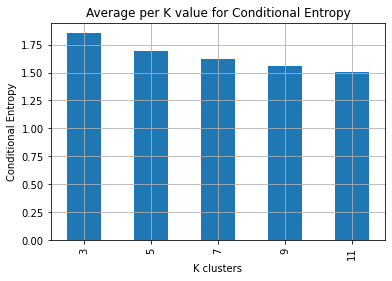

In [ ]:
df_fmeasure_per_k = pd.DataFrame(data = avg_entropy_per_k, index = k_vals)

ax = df_fmeasure_per_k.plot(kind="bar", legend = False, xlabel = 'K clusters', ylabel = 'Conditional Entropy', title = 'Average per K value for Conditional Entropy', grid = True)

## Average of F-measure on all of the 50 images for all K values

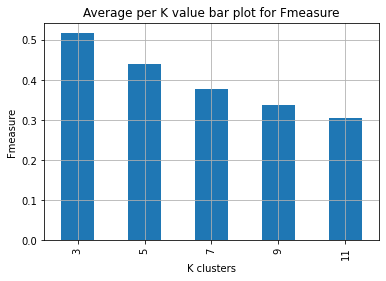

In [ ]:
df_fmeasure_per_k = pd.DataFrame(data = avg_f_measure_per_k, index = k_vals)

ax = df_fmeasure_per_k.plot(kind="bar", legend = False, xlabel = 'K clusters', ylabel = 'Fmeasure', title = 'Average per K value bar plot for Fmeasure', grid = True)

## Good Results


In [ ]:
def draw_results(images, segmented_images, image_list, entropy, fmeasure):
    k_vals = [3, 5, 7, 9, 11]         # K clusters
    for i in image_list:
        plt.imshow(images[i])
        plt.show()
        for k in k_vals:
          fig = plt.figure(figsize=(5, 7))
          plt.imshow(all_segmented_images_per_k[k][i])
          plt.title(f"K = {k}")
          plt.show()
          print("======================================================================================================")
          print(f"Average Conditional Entropy of M trials for image{i} = {np.mean(entropy[k][f'image{i}'])}")
          print(f"Average Fmeasure of M trials for image{i} = {np.mean(fmeasure[k][f'image{i}'])}")
          print("======================================================================================================")

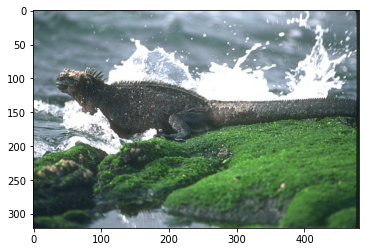

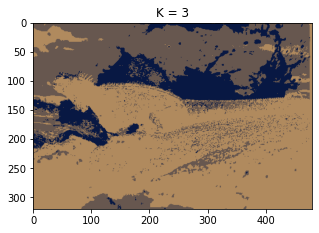

Average Conditional Entropy of M trials for image9 = 1.5702498827909328
Average Fmeasure of M trials for image9 = 0.709939329564707


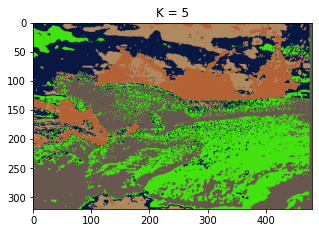

Average Conditional Entropy of M trials for image9 = 1.4414597141070347
Average Fmeasure of M trials for image9 = 0.5572048945199042


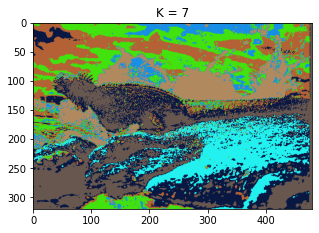

Average Conditional Entropy of M trials for image9 = 1.33131173846466
Average Fmeasure of M trials for image9 = 0.4563190727854911


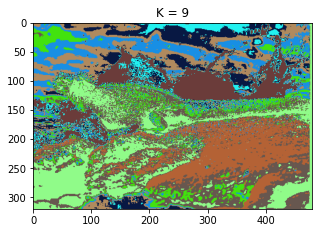

Average Conditional Entropy of M trials for image9 = 1.3005376810813245
Average Fmeasure of M trials for image9 = 0.38684255473111573


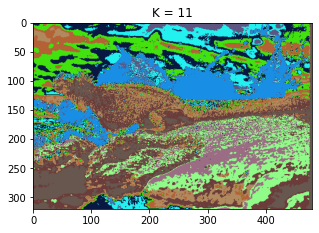

Average Conditional Entropy of M trials for image9 = 1.240657189369724
Average Fmeasure of M trials for image9 = 0.3451436678419418


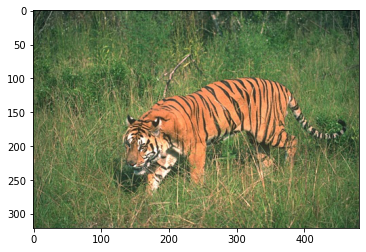

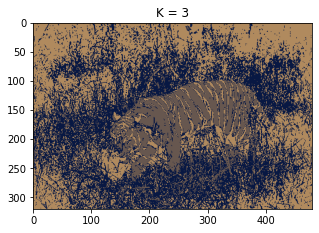

Average Conditional Entropy of M trials for image18 = 0.6060949789265131
Average Fmeasure of M trials for image18 = 0.6365146156135455


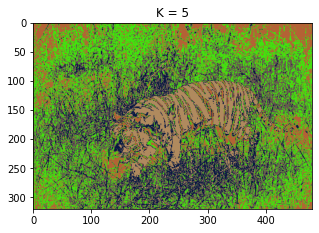

Average Conditional Entropy of M trials for image18 = 0.5694036939668149
Average Fmeasure of M trials for image18 = 0.4281356003510453


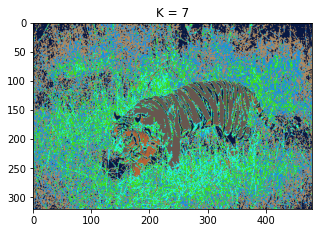

Average Conditional Entropy of M trials for image18 = 0.5429946682231029
Average Fmeasure of M trials for image18 = 0.3309851979930253


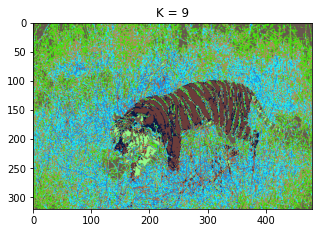

Average Conditional Entropy of M trials for image18 = 0.48814037458417303
Average Fmeasure of M trials for image18 = 0.2864065341178355


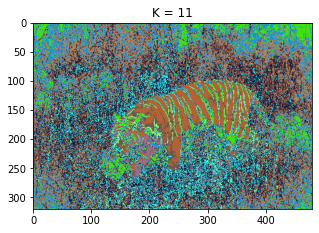

Average Conditional Entropy of M trials for image18 = 0.4429866448828201
Average Fmeasure of M trials for image18 = 0.24684124551788855


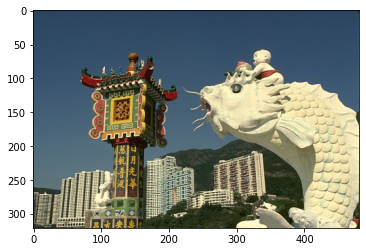

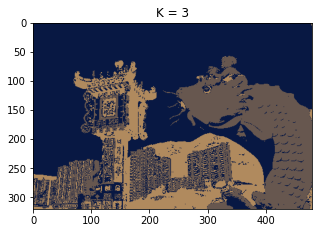

Average Conditional Entropy of M trials for image29 = 2.1446659369102496
Average Fmeasure of M trials for image29 = 0.6504145866015668


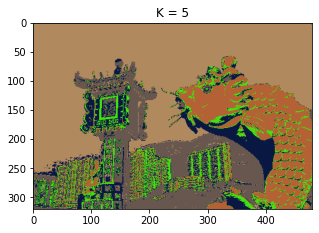

Average Conditional Entropy of M trials for image29 = 1.7711933687847128
Average Fmeasure of M trials for image29 = 0.5020379042759717


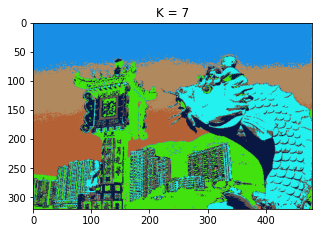

Average Conditional Entropy of M trials for image29 = 1.7589036085874148
Average Fmeasure of M trials for image29 = 0.42564419630383854


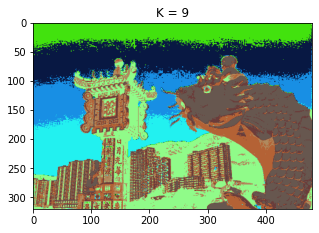

Average Conditional Entropy of M trials for image29 = 1.693383762308684
Average Fmeasure of M trials for image29 = 0.3671710746898903


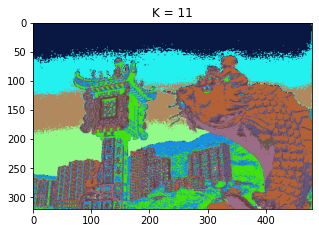

Average Conditional Entropy of M trials for image29 = 1.669788935278363
Average Fmeasure of M trials for image29 = 0.3368589377531076


In [ ]:
good_results = [9, 18, 29]
draw_results(images, all_segmented_images_per_k, good_results, entropy_dict_per_k, fmeasure_dict_per_k)

## Bad Results

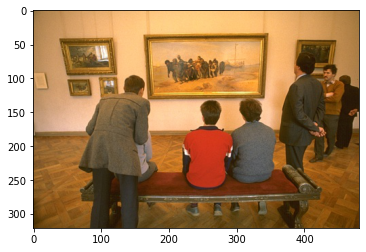

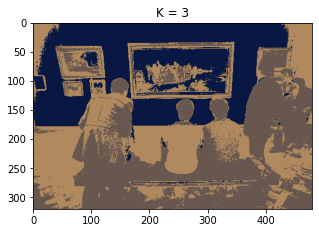

Average Conditional Entropy of M trials for image31 = 2.9871207287738217
Average Fmeasure of M trials for image31 = 0.45328188091374794


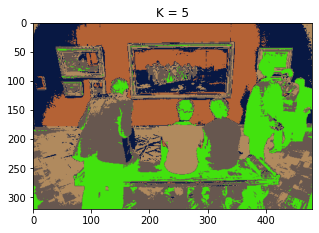

Average Conditional Entropy of M trials for image31 = 2.728610778352913
Average Fmeasure of M trials for image31 = 0.42219402316522076


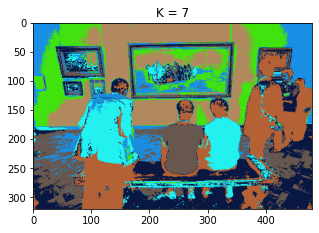

Average Conditional Entropy of M trials for image31 = 2.530105258108216
Average Fmeasure of M trials for image31 = 0.4130617624951288


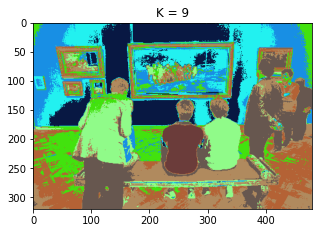

Average Conditional Entropy of M trials for image31 = 2.3841050412296654
Average Fmeasure of M trials for image31 = 0.44793132049713896


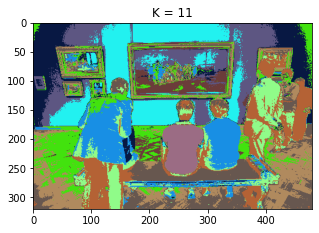

Average Conditional Entropy of M trials for image31 = 2.271193559110019
Average Fmeasure of M trials for image31 = 0.43600906114541527


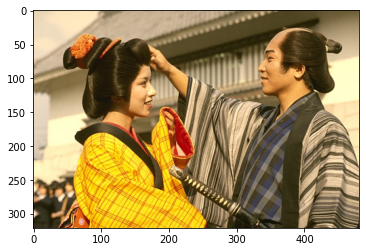

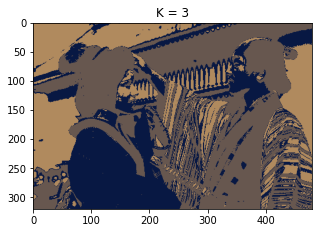

Average Conditional Entropy of M trials for image42 = 3.0425326328323727
Average Fmeasure of M trials for image42 = 0.4399866128499032


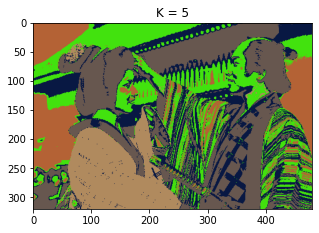

Average Conditional Entropy of M trials for image42 = 2.6931202021703
Average Fmeasure of M trials for image42 = 0.4251810841111582


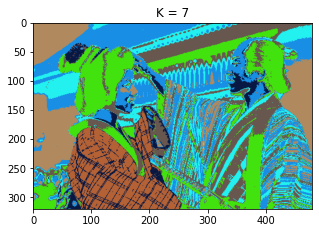

Average Conditional Entropy of M trials for image42 = 2.5852203563188474
Average Fmeasure of M trials for image42 = 0.379774096197724


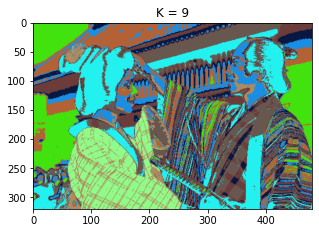

Average Conditional Entropy of M trials for image42 = 2.547523797026878
Average Fmeasure of M trials for image42 = 0.328868289346466


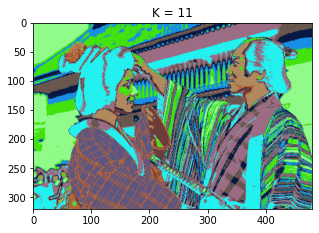

Average Conditional Entropy of M trials for image42 = 2.4180052999215436
Average Fmeasure of M trials for image42 = 0.3324427454656302


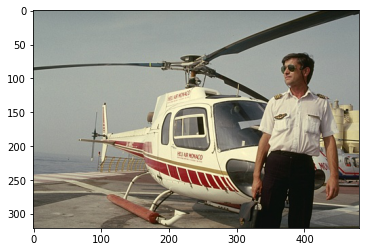

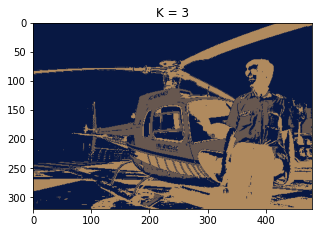

Average Conditional Entropy of M trials for image44 = 3.0440785413678206
Average Fmeasure of M trials for image44 = 0.4317372468337384


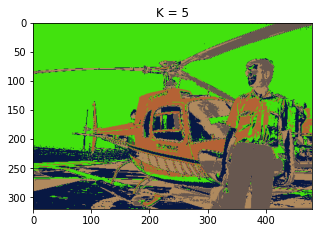

Average Conditional Entropy of M trials for image44 = 2.6821423394643915
Average Fmeasure of M trials for image44 = 0.44466166546304303


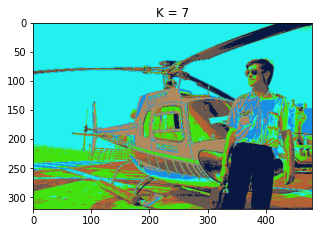

Average Conditional Entropy of M trials for image44 = 2.559456860410477
Average Fmeasure of M trials for image44 = 0.3950684191173871


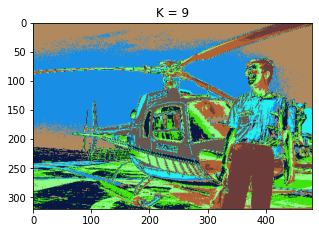

Average Conditional Entropy of M trials for image44 = 2.4823048229669147
Average Fmeasure of M trials for image44 = 0.4079877456121082


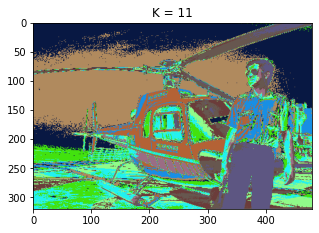

Average Conditional Entropy of M trials for image44 = 2.39780672163163
Average Fmeasure of M trials for image44 = 0.37502959244479006


In [ ]:
bad_results = [31, 42, 44]
draw_results(images, all_segmented_images_per_k, bad_results, entropy_dict_per_k, fmeasure_dict_per_k)

# Big Picture

##Display 5 images with their ground truth against our results of Kmeans with K = 5 

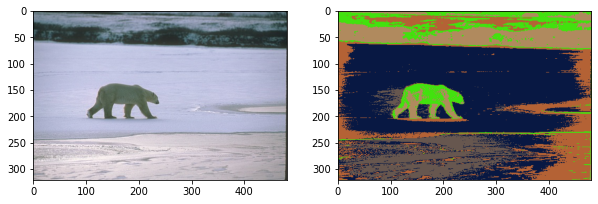

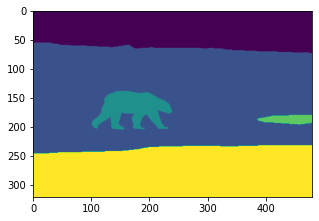

Conditional Entropy with this Ground Truth = 0.9358433110269552
Fmeasure with this Ground Truth = 0.535929948078078


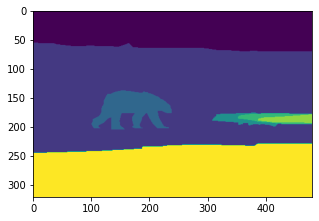

Conditional Entropy with this Ground Truth = 1.0110997041504526
Fmeasure with this Ground Truth = 0.5547621865411949


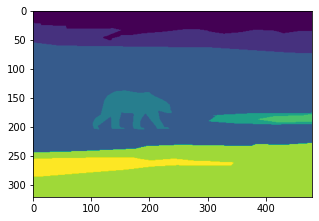

Conditional Entropy with this Ground Truth = 1.2721616392157213
Fmeasure with this Ground Truth = 0.594479010483635


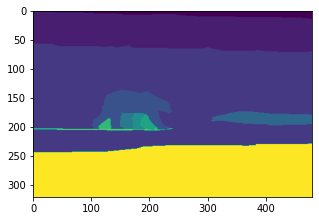

Conditional Entropy with this Ground Truth = 1.1967759842732573
Fmeasure with this Ground Truth = 0.5373219346297061


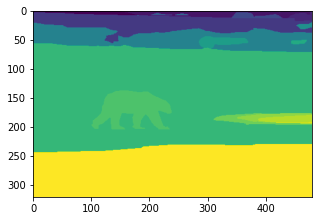

Conditional Entropy with this Ground Truth = 1.272243346579412
Fmeasure with this Ground Truth = 0.5861301954654289


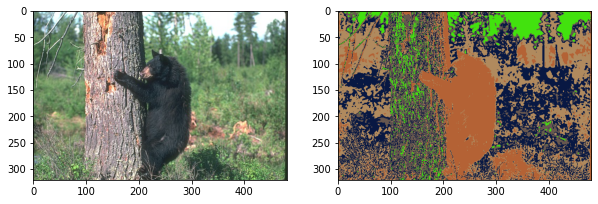

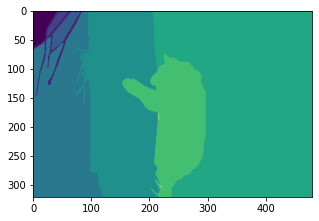

Conditional Entropy with this Ground Truth = 1.6349939594494034
Fmeasure with this Ground Truth = 0.4422495405024889


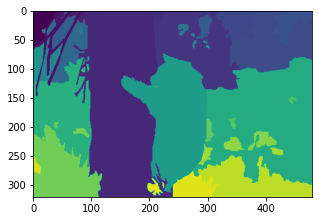

Conditional Entropy with this Ground Truth = 2.9266124623906857
Fmeasure with this Ground Truth = 0.41006686048990515


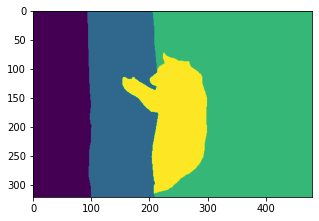

Conditional Entropy with this Ground Truth = 1.4643003417007838
Fmeasure with this Ground Truth = 0.4444293308086847


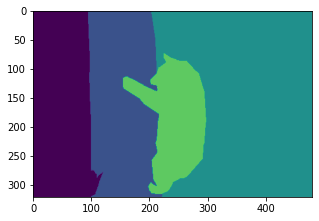

Conditional Entropy with this Ground Truth = 1.4659664572790025
Fmeasure with this Ground Truth = 0.441645524571712


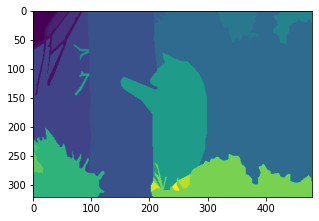

Conditional Entropy with this Ground Truth = 2.205495275032022
Fmeasure with this Ground Truth = 0.442525658524956


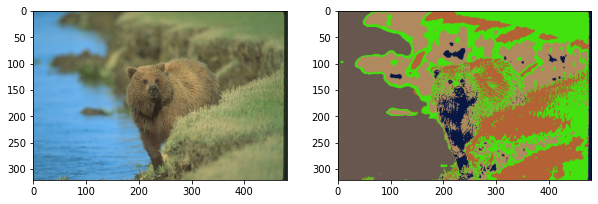

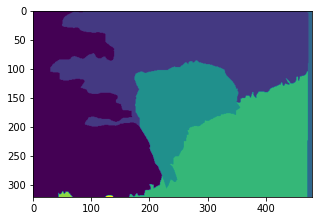

Conditional Entropy with this Ground Truth = 1.0508998914311325
Fmeasure with this Ground Truth = 0.5737390845982175


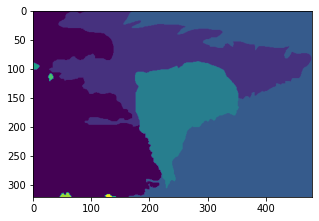

Conditional Entropy with this Ground Truth = 0.9446886037161025
Fmeasure with this Ground Truth = 0.6040182273513036


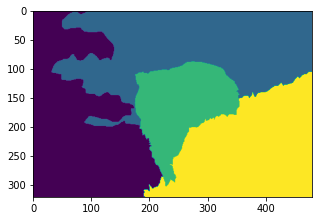

Conditional Entropy with this Ground Truth = 1.0267064520309892
Fmeasure with this Ground Truth = 0.5676599218090772


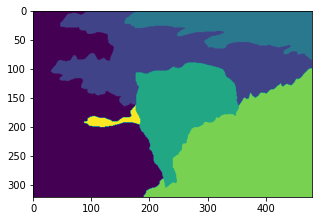

Conditional Entropy with this Ground Truth = 1.2382901769440706
Fmeasure with this Ground Truth = 0.5732787702649419


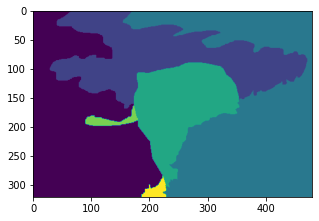

Conditional Entropy with this Ground Truth = 1.006633966866782
Fmeasure with this Ground Truth = 0.6026963248557575


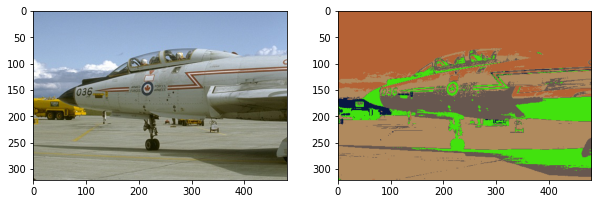

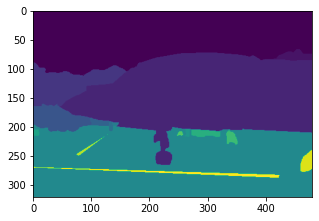

Conditional Entropy with this Ground Truth = 1.207818637383586
Fmeasure with this Ground Truth = 0.6025828333877082


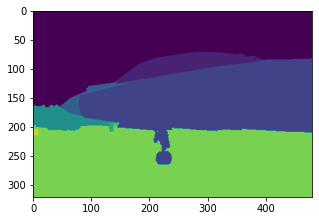

Conditional Entropy with this Ground Truth = 1.0941706507264184
Fmeasure with this Ground Truth = 0.6000479009851657


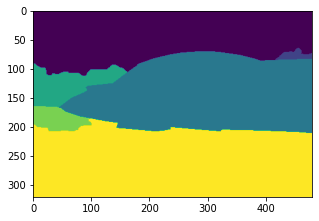

Conditional Entropy with this Ground Truth = 1.0433294843688323
Fmeasure with this Ground Truth = 0.5992448919251515


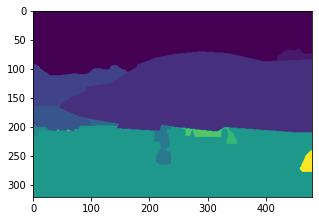

Conditional Entropy with this Ground Truth = 1.1789370054029558
Fmeasure with this Ground Truth = 0.6015929480682529


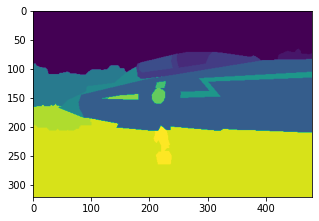

Conditional Entropy with this Ground Truth = 1.4853878074866134
Fmeasure with this Ground Truth = 0.5855376532279377


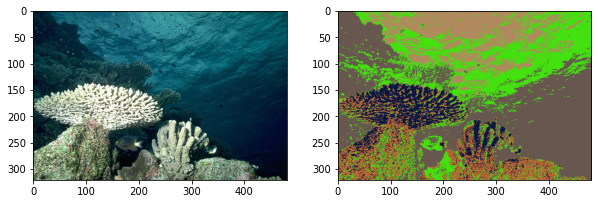

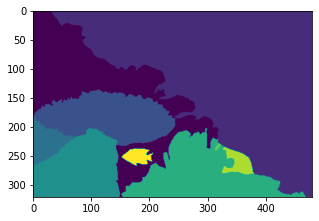

Conditional Entropy with this Ground Truth = 1.4969300605108034
Fmeasure with this Ground Truth = 0.46956802731845854


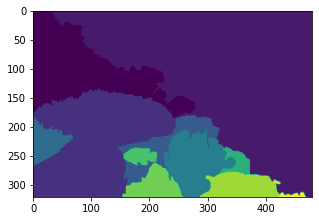

Conditional Entropy with this Ground Truth = 1.6254224628000584
Fmeasure with this Ground Truth = 0.4545031375763058


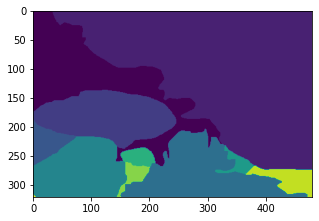

Conditional Entropy with this Ground Truth = 1.6536024989711573
Fmeasure with this Ground Truth = 0.46439911631239517


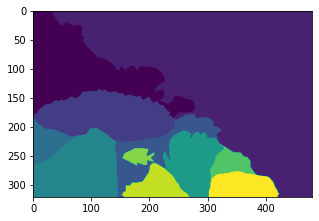

Conditional Entropy with this Ground Truth = 1.7792482415084794
Fmeasure with this Ground Truth = 0.4673349837835007


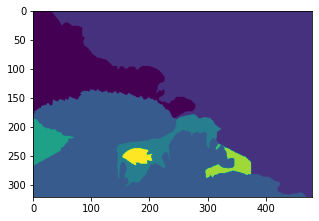

Conditional Entropy with this Ground Truth = 1.1829530605493919
Fmeasure with this Ground Truth = 0.47555924698278795


In [ ]:
for i in range(5):
  big_picture_things(image = images[i],
                     groundTruths = groundTruths_seg[i],
                     segmented_image = all_segmented_images_per_k[5][i],
                     entropy = entropy_dict_per_k[5][f'image{i}'],
                     fmeasure = fmeasure_dict_per_k[5][f'image{i}'])

## Doing Normalized-Cut with 5NN Graph with K = 5

In order to have enough memory for the similarity matrix we resized the image into 20% of its original size

In [ ]:
def resize_images(images,scale):
    if scale>1 or scale<0:
        print('wrong scale.. please retry ')
        return
    y_length=len(images[0])
    x_length=len(images[0][0])
    result=[]
    for i in images:
        result.append(cv2.resize(i, dsize=(int(x_length*scale), int(y_length*scale)), interpolation=cv2.INTER_CUBIC))
    return result

In [ ]:
def normalize(vector):
    norm=np.linalg.norm(vector, ord=1)
    if norm==0:
        return 0
    return vector/norm

In [ ]:
small_images=resize_images(images,0.2)
small_numpy_images=images_to_np_array(small_images)

In [ ]:
def ncut(D,k,tol):
    dist = cdist(D, D, metric='euclidean')
    A=np.zeros(dist.shape)
    for i,j   in enumerate(dist):
        A[i][j.argsort()[:6]]=1
    np.fill_diagonal(A,0)
    A=(A+A.T)*0.5    #making it symmetrical

    delta = np.diag(np.sum(A, axis = 1))
    laplacian = delta - A 
    asymetric_laplacian = np.linalg.inv(delta) @ laplacian
    lamdas, U = np.linalg.eig(asymetric_laplacian)
    idx = np.real(lamdas).argsort()[:k]
    U = U[:,idx]
    lamdas = lamdas[idx]
    rows_norm = np.linalg.norm(U, axis=1)
    normalized_U = (U.T / rows_norm).T
    return Kmeans(normalized_U, k,tol)

In [ ]:
from tqdm.notebook import tqdm as tq
all_ncuts=[ncut(small_numpy_images[i],5,0) for i in tq(range(5))]

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: ComplexWarning: Casting complex values to real discards the imaginary part
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:19: ComplexWarning: Casting complex values to real discards the imaginary part


In [ ]:
small_GTs = []
for i in range(5):
  x = resize_images(groundTruths_seg[i],0.2)
  small_GTs.append(x)

In [ ]:
clusters = []
for i in range(5):
  clusters.append(all_ncuts[i][1])
full_entropy_dict, full_fmeasure_dict = get_full_entropy_and_fmeasure_dict(all_clusters = clusters,
                                                                            groundTruths_seg = small_GTs)

In [ ]:
ncut_images = []
for i in range(5):
  x = map_clusters_to_colors(small_images[i], small_numpy_images[i], all_ncuts[i][1], 5)
  ncut_images.append(x)

## Display same 5 images with their ground truths against our results of Ncut 5NN with K = 5

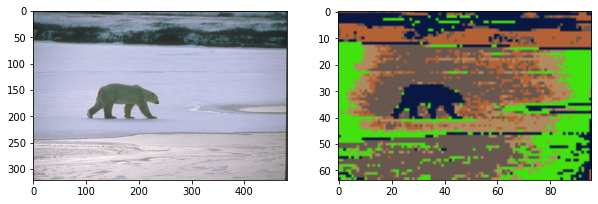

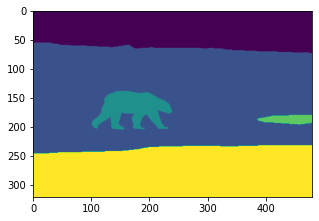

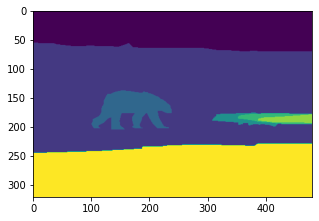

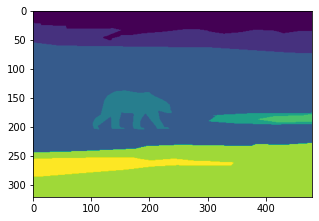

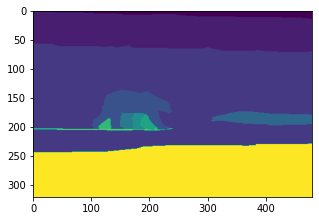

...

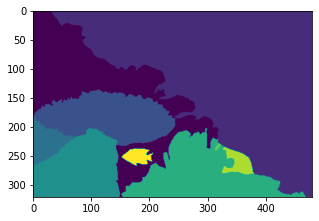

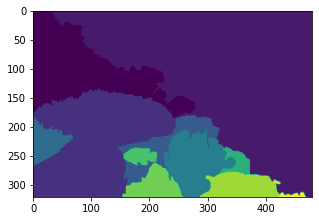

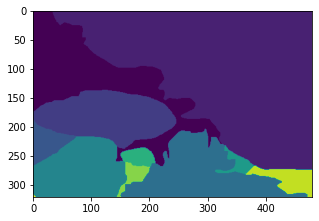

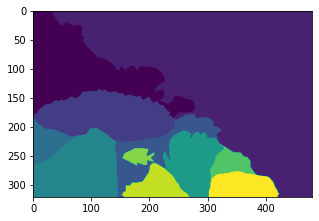

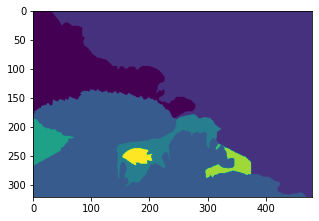

In [ ]:
for i in range(5):
  big_picture_things(image = images[i],
                     groundTruths = groundTruths_seg[i],
                     segmented_image = ncut_images[i])

## Contrasting K-means only segmentations against N-cut segmentations

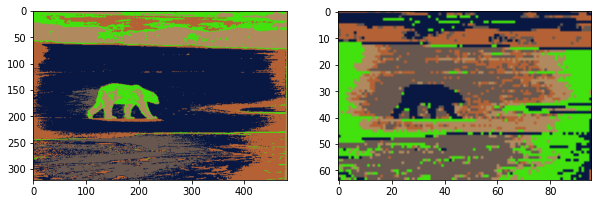

Average Conditional Entropy of M trials of K-means for image0 = 1.1376247970491598
Average Fmeasure of M trials of K-means for image0 = 0.5617246550396086
Average Conditional Entropy of M trials of Ncut clustering for image0 = 1.081846372519045
Average Fmeasure of M trials of Ncut clustering for image0 = 0.5612281712993619


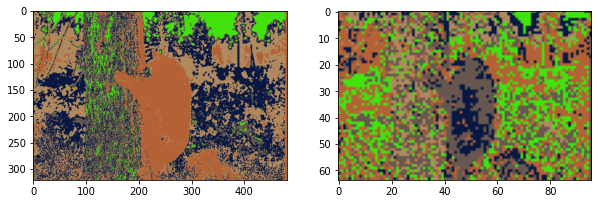

Average Conditional Entropy of M trials of K-means for image1 = 1.9394736991703794
Average Fmeasure of M trials of K-means for image1 = 0.43618338297954934
Average Conditional Entropy of M trials of Ncut clustering for image1 = 1.2359359019346208
Average Fmeasure of M trials of Ncut clustering for image1 = 0.6232297076653357


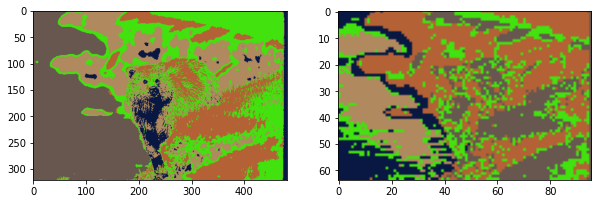

Average Conditional Entropy of M trials of K-means for image2 = 1.0534438181978154
Average Fmeasure of M trials of K-means for image2 = 0.5842784657758596
Average Conditional Entropy of M trials of Ncut clustering for image2 = 0.7575404808321877
Average Fmeasure of M trials of Ncut clustering for image2 = 0.6768571488519934


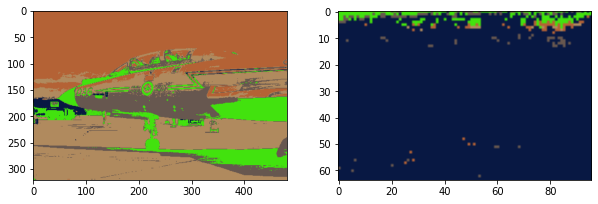

Average Conditional Entropy of M trials of K-means for image3 = 1.201928717073681
Average Fmeasure of M trials of K-means for image3 = 0.5978012455188433
Average Conditional Entropy of M trials of Ncut clustering for image3 = 1.1995655162847016
Average Fmeasure of M trials of Ncut clustering for image3 = 0.48043880437868414


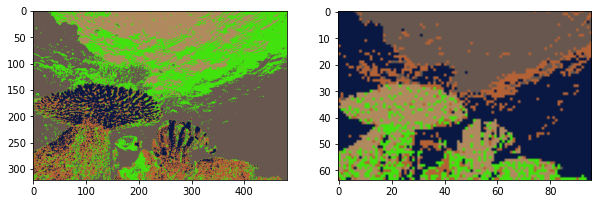

Average Conditional Entropy of M trials of K-means for image4 = 1.5476312648679778
Average Fmeasure of M trials of K-means for image4 = 0.46627290239468966
Average Conditional Entropy of M trials of Ncut clustering for image4 = 1.1932020060460657
Average Fmeasure of M trials of Ncut clustering for image4 = 0.5364708692684761


In [ ]:
for i in range(5):
  draw_image_and_segmentations(images[i], [all_segmented_images_per_k[5][i]], [ncut_images[i]], draw_image=False)
  print("======================================================================================================")
  print(f"Average Conditional Entropy of M trials of K-means for image{i} = {np.mean(entropy_dict_per_k[5][f'image{i}'])}")
  print(f"Average Fmeasure of M trials of K-means for image{i} = {np.mean(fmeasure_dict_per_k[5][f'image{i}'])}")
  print(f"Average Conditional Entropy of M trials of Ncut clustering for image{i} = {np.mean(full_entropy_dict[f'image{i}'])}")
  print(f"Average Fmeasure of M trials of Ncut clustering for image{i} = {np.mean(full_fmeasure_dict[f'image{i}'])}")
  print("======================================================================================================")

# Extra

In [ ]:
t1 = time.time()

all_segmented_images, all_clusters = get_all_clustered_images(images=images[:5], 
                                                              vectorized_images=images_np_extra[:5], 
                                                              k = 5)

full_entropy_dict, full_fmeasure_dict = get_full_entropy_and_fmeasure_dict(all_clusters = all_clusters,
                                                                           groundTruths_seg = groundTruths_seg[:5])
  
t2 = time.time()

print(f"time taken to run with all K = 5: {t2 - t1}")

time taken to run with all K = 5: 25.789774656295776


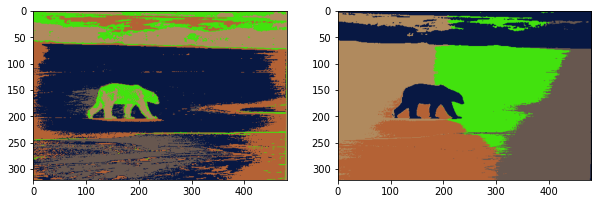

Average Conditional Entropy of M trials of K-means for image0 = 1.1376247970491598
Average Fmeasure of M trials of K-means for image0 = 0.5617246550396086
Average Conditional Entropy of M trials of spatial clustering for image0 = 1.081846372519045
Average Fmeasure of M trials of spatial clustering for image0 = 0.5612281712993619


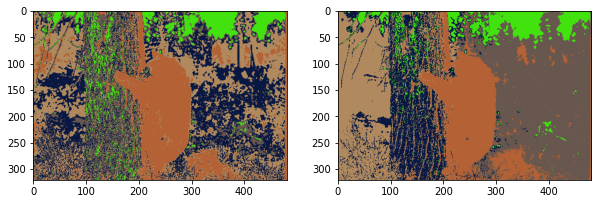

Average Conditional Entropy of M trials of K-means for image1 = 1.9394736991703794
Average Fmeasure of M trials of K-means for image1 = 0.43618338297954934
Average Conditional Entropy of M trials of spatial clustering for image1 = 1.2359359019346208
Average Fmeasure of M trials of spatial clustering for image1 = 0.6232297076653357


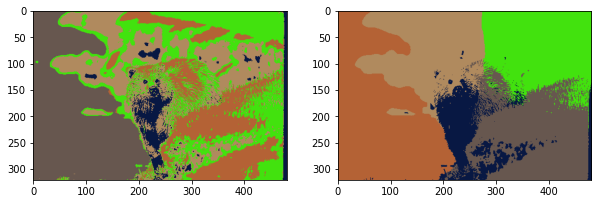

Average Conditional Entropy of M trials of K-means for image2 = 1.0534438181978154
Average Fmeasure of M trials of K-means for image2 = 0.5842784657758596
Average Conditional Entropy of M trials of spatial clustering for image2 = 0.7575404808321877
Average Fmeasure of M trials of spatial clustering for image2 = 0.6768571488519934


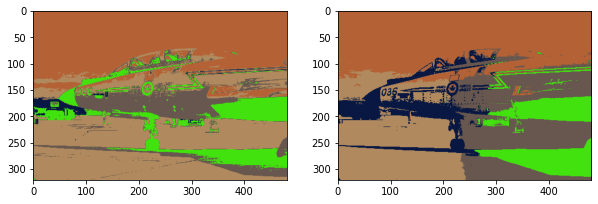

Average Conditional Entropy of M trials of K-means for image3 = 1.201928717073681
Average Fmeasure of M trials of K-means for image3 = 0.5978012455188433
Average Conditional Entropy of M trials of spatial clustering for image3 = 1.1995655162847016
Average Fmeasure of M trials of spatial clustering for image3 = 0.48043880437868414


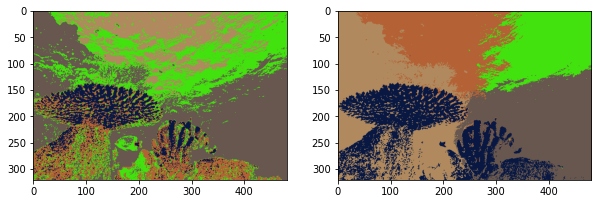

Average Conditional Entropy of M trials of K-means for image4 = 1.5476312648679778
Average Fmeasure of M trials of K-means for image4 = 0.46627290239468966
Average Conditional Entropy of M trials of spatial clustering for image4 = 1.1932020060460657
Average Fmeasure of M trials of spatial clustering for image4 = 0.5364708692684761


In [ ]:
for i in range(5):
  draw_image_and_segmentations(images[i], [all_segmented_images_per_k[5][i]], [all_segmented_images[i]], draw_image=False)
  print("======================================================================================================")
  print(f"Average Conditional Entropy of M trials of K-means for image{i} = {np.mean(entropy_dict_per_k[5][f'image{i}'])}")
  print(f"Average Fmeasure of M trials of K-means for image{i} = {np.mean(fmeasure_dict_per_k[5][f'image{i}'])}")
  print(f"Average Conditional Entropy of M trials of spatial clustering for image{i} = {np.mean(full_entropy_dict[f'image{i}'])}")
  print(f"Average Fmeasure of M trials of spatial clustering for image{i} = {np.mean(full_fmeasure_dict[f'image{i}'])}")
  print("======================================================================================================")

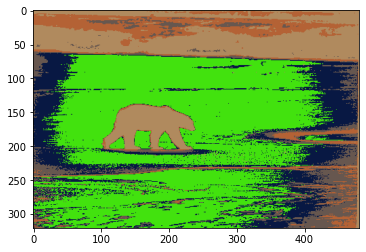

In [ ]:
'''re-classifying the original image with full size using the output of the ncut
algorithm as labels for the KNN classifier'''
from sklearn.neighbors import  KNeighborsClassifier as clasifier
clsfy=clasifier(n_neighbors=1)
clsfy.fit(small_numpy_images[0],clusters)
big_classified=clsfy.predict(numpy_images[0])
plt.imshow(map_clusters_to_colors(images[0],numpy_images[0],big_classified, k))
